# <center> **STRUCTURING AND IMPORTING THE NECESSARY LIBRARIES**  </center>

In [1]:
#IMPORT ALL THE NECESSARY LIBRARIES 

# Data Processing
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Data Visualization
import matplotlib.pyplot as plt
import statsmodels.api as sm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from matplotlib.transforms import Affine2D
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf , plot_pacf
import mplcursors  # Import mplcursors for interactive plotting
import itertools


#We use the glob () function since we are working from the same directory 
import os
import glob 

# Statistical Computation
from statsmodels.tsa.stattools import adfuller

# Prophet model for Time Series
from prophet import Prophet

# Random Forest and Linear Regression for Machine Learning
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from tensorflow.keras.callbacks import Callback

# Bi-LSTM For Machine Learning
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout
import contextlib
import sys

# ARIMA For Time Series
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA

# Training and Testing 
from sklearn.model_selection import train_test_split

# Metrics Computation
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from sklearn.metrics import r2_score, explained_variance_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

#Importing Warnings and Hiding them
import warnings                
warnings.filterwarnings('ignore')  

# <center>**IMPORTING AND REVIEWING THE DATASET**</center>
#### <u>CLOSING PRICE FOR HSBC, BAC, BARC AND JPM</u>

In [2]:
# Load CSV file with proper date parsing
df_stock = pd.read_csv('stock-yy-mm-dd.csv', parse_dates=['Dates'])

# Convert 'Dates' column to datetime format
df_stock['Dates'] = pd.to_datetime(df_stock['Dates'], format='%Y-%m-%d')

# Check the basic information about the DataFrame
df_stock.info()

# This line will print the first 1044 rows of the DataFrame
df_stock.head(1044)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1043 entries, 0 to 1042
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Dates           1043 non-null   datetime64[ns]
 1   HSBA LN Equity  1043 non-null   float64       
 2   BARC LN Equity  1043 non-null   float64       
 3   JPM UN Equity   1043 non-null   float64       
 4   BAC UN Equity   1043 non-null   float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 40.9 KB


,Dates,HSBA LN Equity,BARC LN Equity,JPM UN Equity,BAC UN Equity
0,2020-01-01,5.919,1.796,105.10443,26.55080
1,2020-01-02,5.951,1.852,107.41530,27.13361
2,2020-01-03,5.944,1.833,105.69988,26.66565
3,2020-01-06,5.852,1.810,105.03799,26.48176
4,2020-01-07,5.834,1.831,103.50396,26.37112
...,...,...,...,...,...
1038,2023-12-25,6.278,1.518,131.71768,26.30419
1039,2023-12-26,6.278,1.518,132.51751,26.64673
1040,2023-12-27,6.315,1.537,132.44722,26.45817
1041,2023-12-28,6.316,1.535,133.68396,26.59549


#### <u>SCALING THE DATA</u>

In [3]:
# Initialize the scaler
scaler = MinMaxScaler()

# Select the columns to be scaled (excluding any non-numeric columns)
numeric_cols = df_stock.select_dtypes(include=['float64', 'int64']).columns

# Fit the scaler on the data and transform it
df_stock_scaled = df_stock.copy()  # Make a copy of the DataFrame to avoid modifying the original data
df_stock_scaled[numeric_cols] = scaler.fit_transform(df_stock[numeric_cols])

# Now df_stock_scaled contains the scaled version of the data


# <center>**DATA EXPLORATORY ANALYSIS**</center>

#### <u>PLOTTING THE TREND FOR THE DATASET TO IDENTIFY PATTERNS</u>

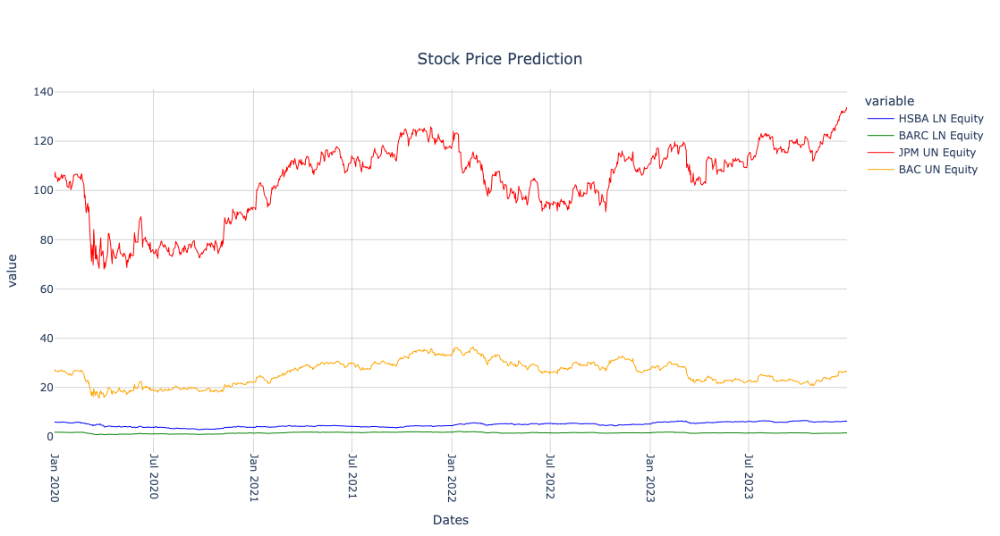

In [4]:
# Define color map for each line
color_map = {'HSBA LN Equity': 'blue', 
             'BARC LN Equity': 'green', 
             'JPM UN Equity': 'red', 
             'BAC UN Equity': 'orange'}

fig = px.line(df_stock, x='Dates', y=['HSBA LN Equity', 'BARC LN Equity', 'JPM UN Equity', 'BAC UN Equity'], 
              title='Stock Price Prediction', color_discrete_map=color_map)
fig.update_xaxes(rangeslider_visible=False, tickangle=90)  # Rotate x-axis ticks vertically

# Adjust trend line thickness
fig.update_traces(line=dict(width=1))

# Add legend
fig.update_layout(showlegend=True)

# Center the title
fig.update_layout(title=dict(x=0.5, y=0.9, xanchor='center', yanchor='top'))

# Increase the graph size and adjust margins
fig.update_layout(
    autosize=False,
    width=1000,  # Adjust width as needed
    height=600,  # Adjust height as needed
    margin=dict(l=50, r=50, t=100, b=50),  # Adjust margins as needed
)

# Set graph background color
fig.update_layout(plot_bgcolor='white')

# Add grid
fig.update_layout(xaxis=dict(showgrid=True, gridwidth=1, gridcolor='lightgray'),
                  yaxis=dict(showgrid=True, gridwidth=1, gridcolor='lightgray'))

# Enable zoom and pan
fig.update_layout(
    dragmode='zoom',  # Enable zooming
)

fig.show()


#### <u>DECOMPOSING OUR DATASET USING TIME SERIES ANALYSIS</u>

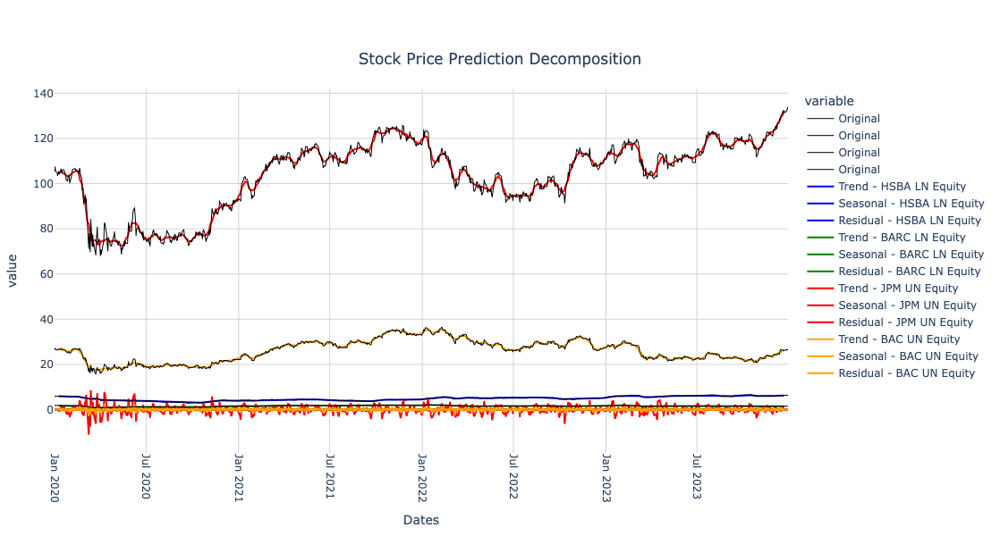

In [5]:
# Perform time series decomposition for each time series
decomposition_results = {}
for column in ['HSBA LN Equity', 'BARC LN Equity', 'JPM UN Equity', 'BAC UN Equity']:
    result = seasonal_decompose(df_stock[column], model='additive', period=12)  # Assuming a seasonal period of 12
    decomposition_results[column] = result

# Extract components for each time series
trend = {column: result.trend for column, result in decomposition_results.items()}
seasonal = {column: result.seasonal for column, result in decomposition_results.items()}
residual = {column: result.resid for column, result in decomposition_results.items()}

# Define color map for each line
color_map = {'HSBA LN Equity': 'blue', 
             'BARC LN Equity': 'green', 
             'JPM UN Equity': 'red', 
             'BAC UN Equity': 'orange'}

# Plot original time series
fig = px.line(df_stock, x='Dates', y=['HSBA LN Equity', 'BARC LN Equity', 'JPM UN Equity', 'BAC UN Equity'], 
              title='Stock Price Prediction Decomposition')

fig.update_xaxes(rangeslider_visible=False, tickangle=90)  # Rotate x-axis ticks vertically

# Adjust trend line thickness and color
fig.update_traces(line=dict(width=1, color='black'), name='Original')

# Add legend
fig.update_layout(showlegend=True)

# Center the title
fig.update_layout(title=dict(x=0.5, y=0.9, xanchor='center', yanchor='top'))

# Increase the graph size and adjust margins
fig.update_layout(
    autosize=False,
    width=1000,  # Adjust width as needed
    height=600,  # Adjust height as needed
    margin=dict(l=50, r=50, t=100, b=50),  # Adjust margins as needed
)

# Set graph background color
fig.update_layout(plot_bgcolor='white')

# Add grid
fig.update_layout(xaxis=dict(showgrid=True, gridwidth=1, gridcolor='lightgray'),
                  yaxis=dict(showgrid=True, gridwidth=1, gridcolor='lightgray'))

# Enable zoom and pan
fig.update_layout(
    dragmode='zoom',  # Enable zooming
)

# Plot decomposed components with legend for each time series
for column in ['HSBA LN Equity', 'BARC LN Equity', 'JPM UN Equity', 'BAC UN Equity']:
    fig.add_trace(go.Scatter(x=df_stock['Dates'], y=trend[column], mode='lines', name=f'Trend - {column}', line=dict(color=color_map[column])))
    fig.add_trace(go.Scatter(x=df_stock['Dates'], y=seasonal[column], mode='lines', name=f'Seasonal - {column}', line=dict(color=color_map[column])))
    fig.add_trace(go.Scatter(x=df_stock['Dates'], y=residual[column], mode='lines', name=f'Residual - {column}', line=dict(color=color_map[column])))

fig.show()

#### <u>SEPARATING THE DECOMPOSITION FOR EACH BANK [HSBA, BARC, JPM AND BAC]</u>

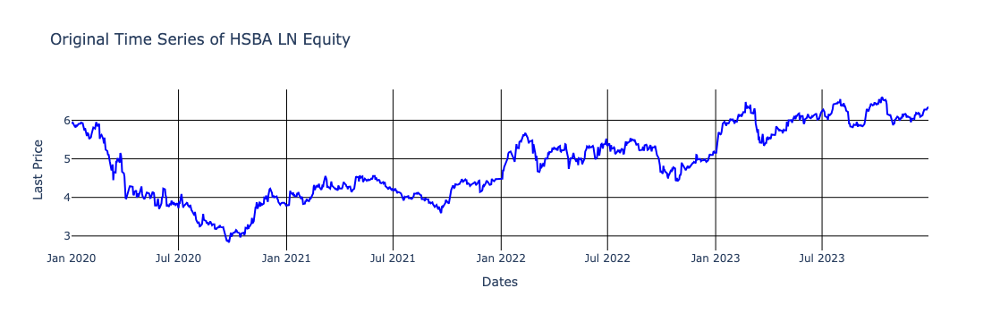

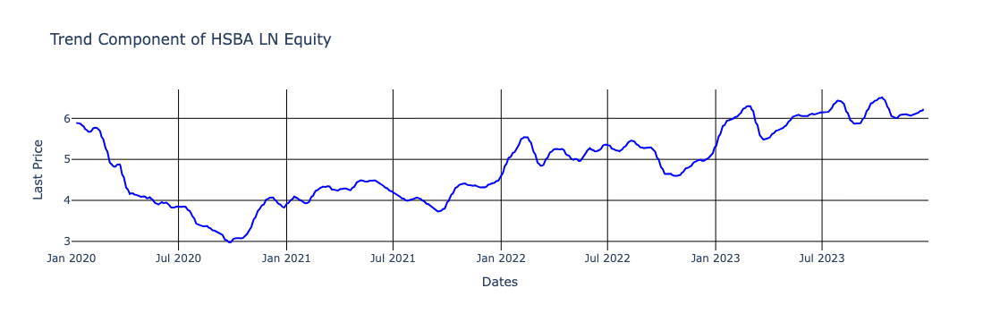

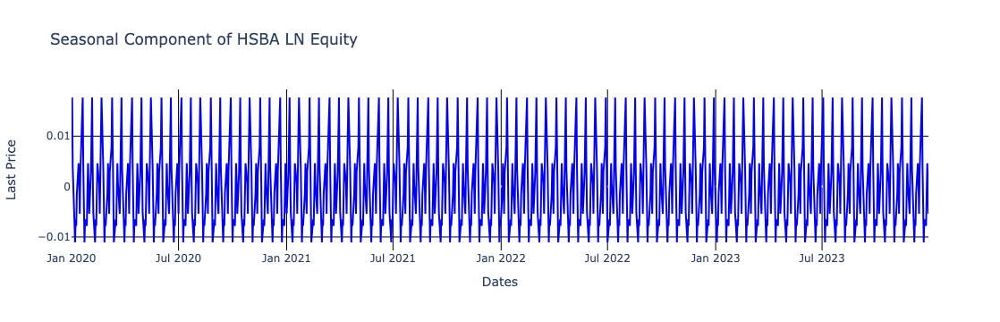

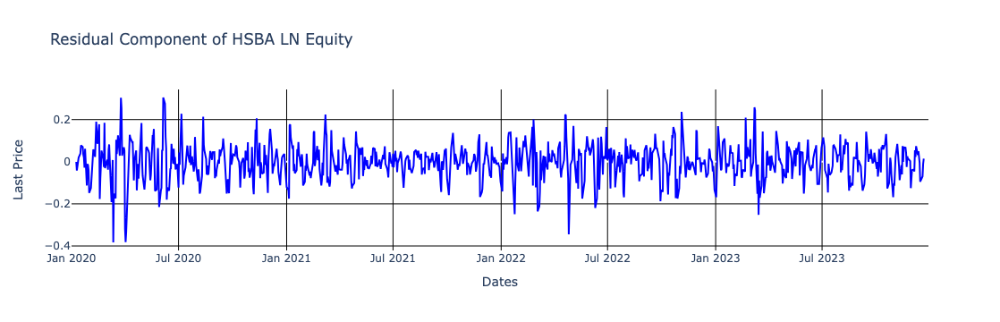

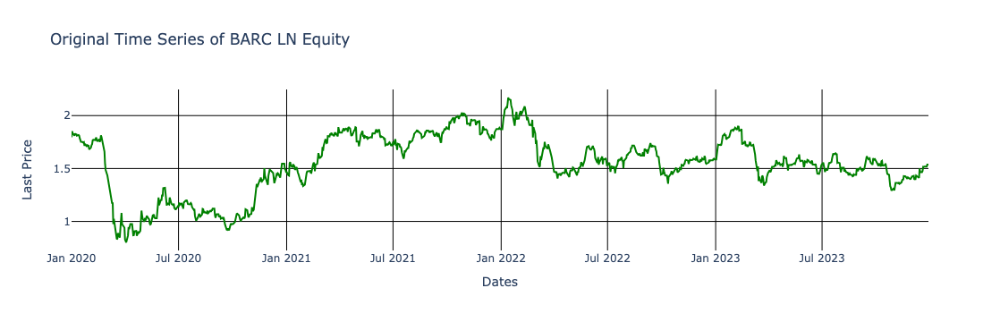

...

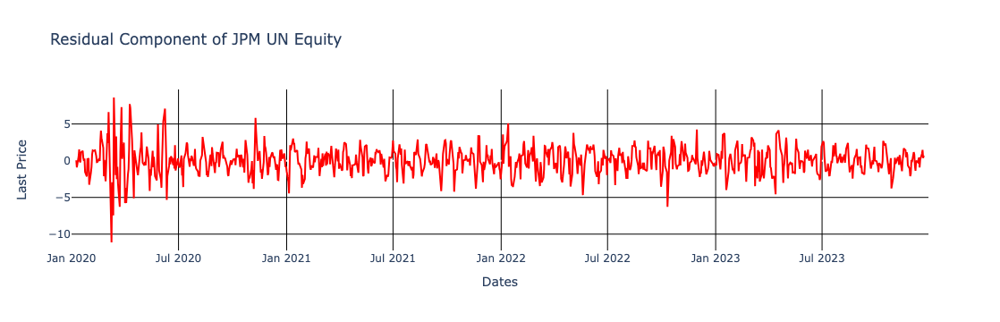

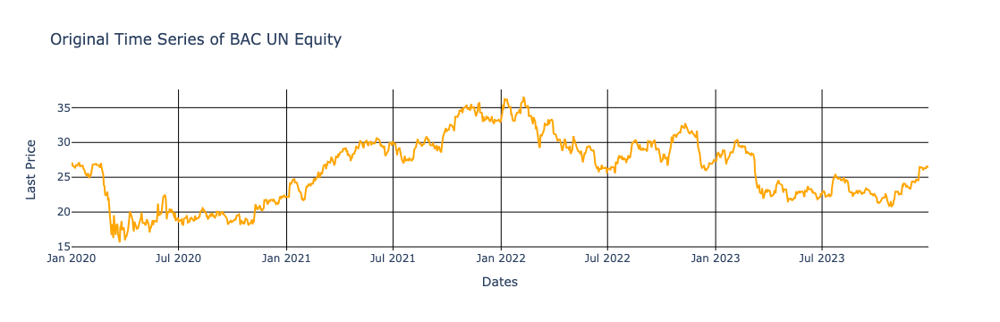

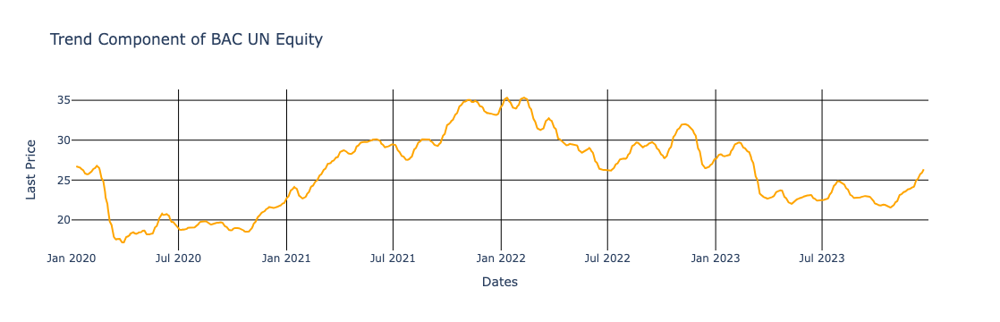

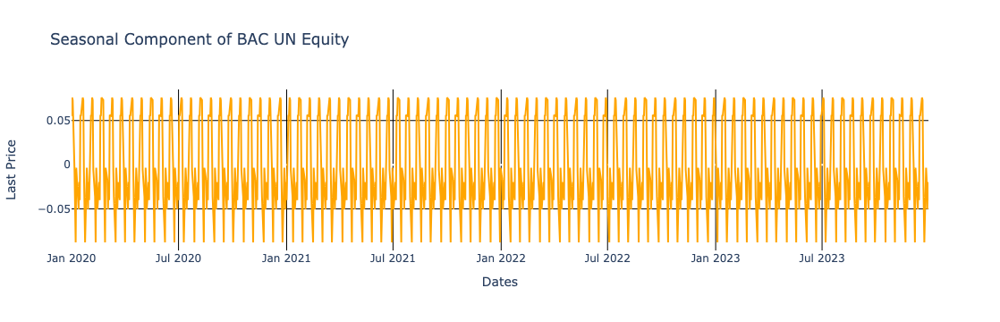

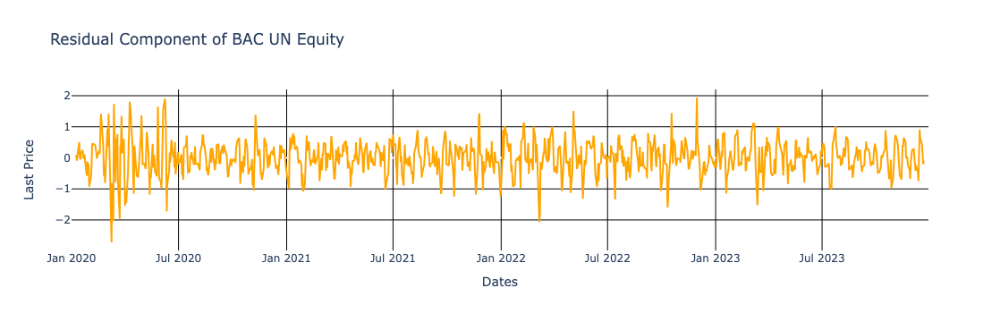

In [6]:
# Define color map for each line
color_map = {'HSBA LN Equity': 'blue', 
             'BARC LN Equity': 'green', 
             'JPM UN Equity': 'red', 
             'BAC UN Equity': 'orange'}

# Plot original time series, trend, seasonality, and residual for each time series
for column in ['HSBA LN Equity', 'BARC LN Equity', 'JPM UN Equity', 'BAC UN Equity']:
    # Original Time Series
    fig_original = go.Figure()
    fig_original.add_trace(go.Scatter(x=df_stock['Dates'], y=df_stock[column], mode='lines', name=f'Original - {column}', line=dict(color=color_map[column])))
    fig_original.update_layout(title=f'Original Time Series of {column}', xaxis_title='Dates', yaxis_title='Last Price')
    fig_original.update_layout(plot_bgcolor='white', xaxis=dict(showgrid=True, gridwidth=1, gridcolor='black'), yaxis=dict(showgrid=True, gridwidth=1, gridcolor='black'))
    fig_original.show()

    # Trend Component
    fig_trend = go.Figure()
    fig_trend.add_trace(go.Scatter(x=df_stock['Dates'], y=trend[column], mode='lines', name=f'Trend - {column}', line=dict(color=color_map[column])))
    fig_trend.update_layout(title=f'Trend Component of {column}', xaxis_title='Dates', yaxis_title='Last Price')
    fig_trend.update_layout(plot_bgcolor='white', xaxis=dict(showgrid=True, gridwidth=1, gridcolor='black'), yaxis=dict(showgrid=True, gridwidth=1, gridcolor='black'))
    fig_trend.show()

    # Seasonal Component
    fig_seasonal = go.Figure()
    fig_seasonal.add_trace(go.Scatter(x=df_stock['Dates'], y=seasonal[column], mode='lines', name=f'Seasonal - {column}', line=dict(color=color_map[column])))
    fig_seasonal.update_layout(title=f'Seasonal Component of {column}', xaxis_title='Dates', yaxis_title='Last Price')
    fig_seasonal.update_layout(plot_bgcolor='white', xaxis=dict(showgrid=True, gridwidth=1, gridcolor='black'), yaxis=dict(showgrid=True, gridwidth=1, gridcolor='black'))
    fig_seasonal.show()

    # Residual Component
    fig_residual = go.Figure()
    fig_residual.add_trace(go.Scatter(x=df_stock['Dates'], y=residual[column], mode='lines', name=f'Residual - {column}', line=dict(color=color_map[column])))
    fig_residual.update_layout(title=f'Residual Component of {column}', xaxis_title='Dates', yaxis_title='Last Price')
    fig_residual.update_layout(plot_bgcolor='white', xaxis=dict(showgrid=True, gridwidth=1, gridcolor='black'), yaxis=dict(showgrid=True, gridwidth=1, gridcolor='black'))
    fig_residual.show()

#### <u>CHECKING FOR OUTLIERS IN THE DATASET</u> 

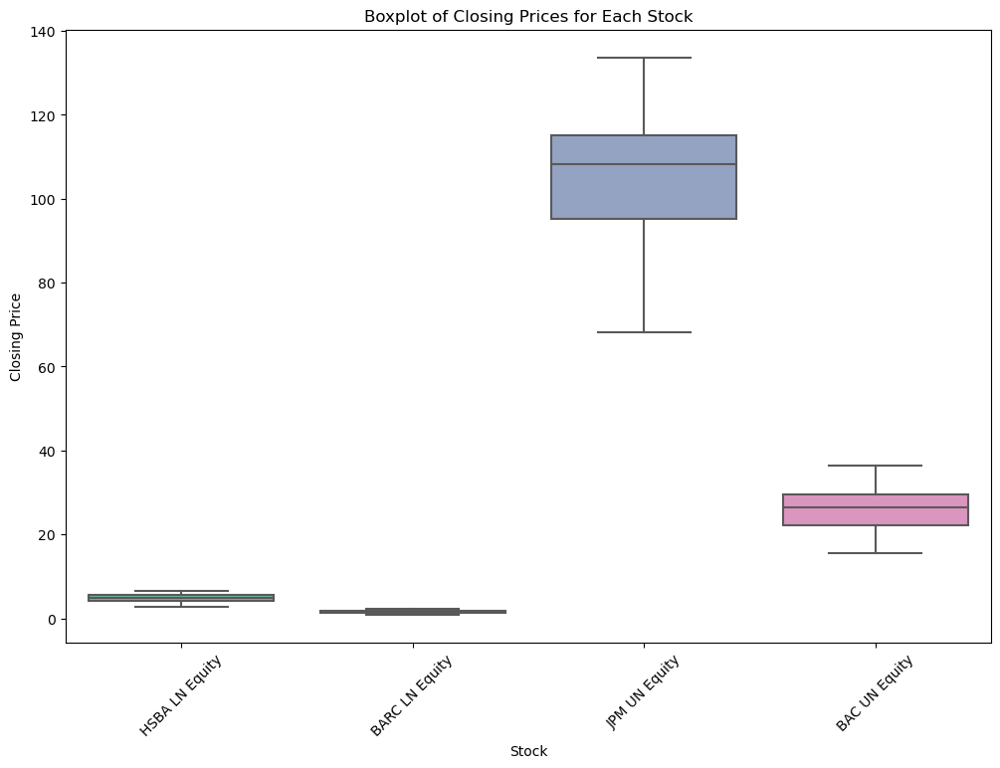

In [7]:
# Set up the figure size
plt.figure(figsize=(12, 8))

# Create boxplots for each stock's closing price with switched axes
ax = sns.boxplot(data=df_stock.iloc[:, 1:], orient="v", palette="Set2", showfliers=False)

# Rotate the x-axis labels
ax.tick_params(axis='x', rotation=45)

plt.title('Boxplot of Closing Prices for Each Stock')
plt.xlabel('Stock')
plt.ylabel('Closing Price')

plt.show()


#### <u>CHECKING FOR CORRELATION BETWEEN THE STOCKS [HSBA, BAC, BARC AND JPM]</u>

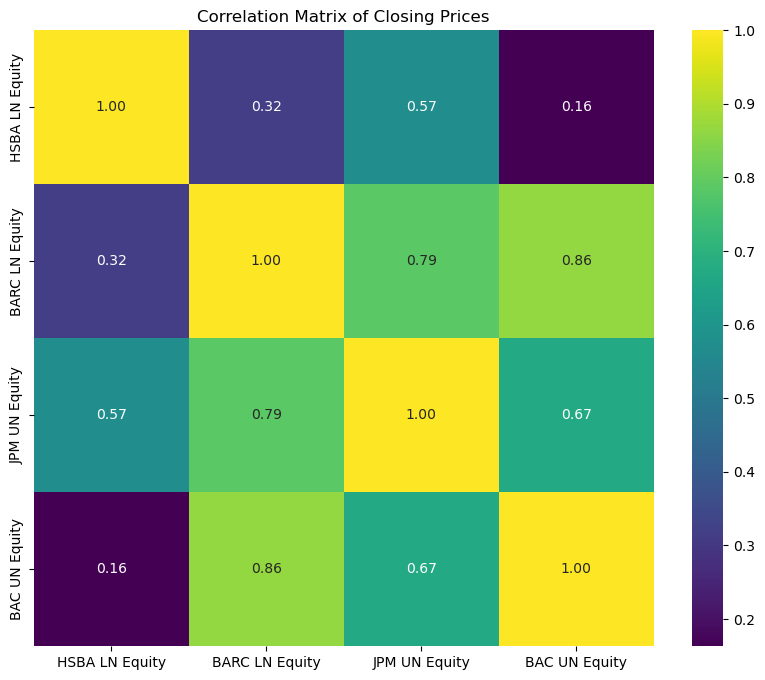

In [8]:
# Compute the correlation matrix
corr = df_stock.iloc[:, 1:].corr()

# Generate a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='viridis', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Matrix of Closing Prices')
plt.show()


#### <u>ANALYZING AUTOCORRELATION FOR HSBA, BACR, JPM AND BAC</u>

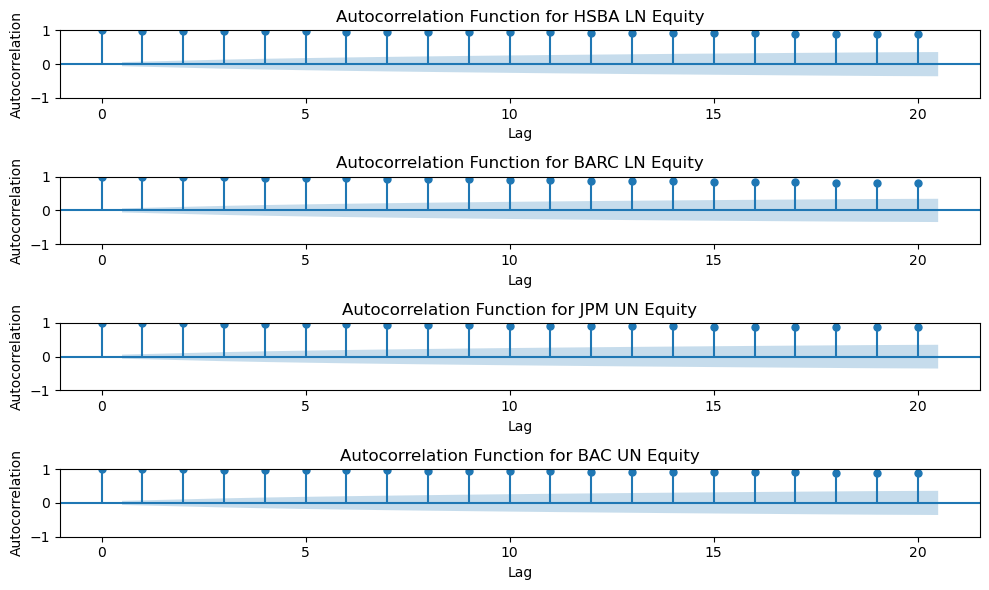

In [9]:
# Extract the time series data
time_series = df_stock[['HSBA LN Equity', 'BARC LN Equity', 'JPM UN Equity', 'BAC UN Equity']]  # Assuming these are the appropriate column names

# Plot the autocorrelation function for each column
fig, axes = plt.subplots(nrows=len(time_series.columns), figsize=(10, 6))

for i, (column, series) in enumerate(time_series.items()):
    plot_acf(series, lags=20, ax=axes[i])  # Adjust the number of lags as needed
    axes[i].set_title(f'Autocorrelation Function for {column}')
    axes[i].set_xlabel('Lag')
    axes[i].set_ylabel('Autocorrelation')

plt.tight_layout()
plt.show()

#### <u> CONDUCTING DICKEY-FULLER TEST ON STOCK TIME SERIES FOR STATIONARITY</u>

In [10]:
# Perform the Dickey-Fuller test for each time series
for column in ['HSBA LN Equity', 'BARC LN Equity', 'JPM UN Equity', 'BAC UN Equity']:
    # Extract the time series data
    time_series = df_stock[column]

    # Perform the Dickey-Fuller test
    result = adfuller(time_series)

    # Print the test statistic and p-value
    print(f'ADF Statistic for {column}:', result[0])
    print(f'p-value for {column}:', result[1])

    # Print critical values
    print(f'Critical Values for {column}:')
    for key, value in result[4].items():
        print(f'{key}: {value}')

    print()  # Add an empty line for better readability

ADF Statistic for HSBA LN Equity: -1.0845055455923853
p-value for HSBA LN Equity: 0.7212111967624018
Critical Values for HSBA LN Equity:
1%: -3.436777287462024
5%: -2.8643777347701866
10%: -2.5682809352172242

ADF Statistic for BARC LN Equity: -2.2292919587745663
p-value for BARC LN Equity: 0.1957864215898077
Critical Values for BARC LN Equity:
1%: -3.4366533786777778
5%: -2.864323084781805
10%: -2.568251827847633

ADF Statistic for JPM UN Equity: -1.2363548491324334
p-value for JPM UN Equity: 0.6577645995802274
Critical Values for JPM UN Equity:
1%: -3.4367023644255537
5%: -2.864344690221488
10%: -2.5682633351736674

ADF Statistic for BAC UN Equity: -1.897032703926221
p-value for BAC UN Equity: 0.3334583055062478
Critical Values for BAC UN Equity:
1%: -3.4366961996098264
5%: -2.8643419712141074
10%: -2.5682618869934934



# <center>**STOCK PRICE PREDICTION WITH PROPHET**</center>
### <center><u>**DATA PRE-PROCESSING**</u></center>
#### <u>TRANSFORM THE DATASET INTO A MULTIPLE TIME SERIES MODEL DATASET</u>

In [11]:
# Release Date from the index
df_stock=df_stock.reset_index()

# Melt the DataFrame to convert it to long format
df_stock = pd.melt(df_stock, id_vars='Dates', value_vars=['HSBA LN Equity', 'BARC LN Equity', 'JPM UN Equity', 'BAC UN Equity'], var_name='ticker', value_name='y')
df_stock.columns = ['ds', 'ticker', 'y']

# Round the 'y' values to two decimal places
df_stock['y'] = df_stock['y'].round(2)

tickers_to_check = ['HSBA LN Equity', 'BARC LN Equity', 'JPM UN Equity', 'BAC UN Equity']

#Check if the tickers are in the Data Frame
for ticker in tickers_to_check:
    if ticker in df_stock['ticker'].unique():
        print(f"{ticker} is present in the DataFrame.")
    else:
        print(f"{ticker} is not present in the DataFrame.")

# Print the first few rows of the DataFrame
print(df_stock.head(1043))
df_stock.info()

HSBA LN Equity is present in the DataFrame.
BARC LN Equity is present in the DataFrame.
JPM UN Equity is present in the DataFrame.
BAC UN Equity is present in the DataFrame.
             ds          ticker     y
0    2020-01-01  HSBA LN Equity  5.92
1    2020-01-02  HSBA LN Equity  5.95
2    2020-01-03  HSBA LN Equity  5.94
3    2020-01-06  HSBA LN Equity  5.85
4    2020-01-07  HSBA LN Equity  5.83
...         ...             ...   ...
1038 2023-12-25  HSBA LN Equity  6.28
1039 2023-12-26  HSBA LN Equity  6.28
1040 2023-12-27  HSBA LN Equity  6.32
1041 2023-12-28  HSBA LN Equity  6.32
1042 2023-12-29  HSBA LN Equity  6.36

[1043 rows x 3 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4172 entries, 0 to 4171
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      4172 non-null   datetime64[ns]
 1   ticker  4172 non-null   object        
 2   y       4172 non-null   float64       
dtypes: datetime64[

#### GROUPING THE DATA BY TICKER FOR BETTER ANALYSIS AND VISUALIZATION

In [12]:
#Group the data by ticker
groups_by_ticker = df_stock.groupby('ticker')

#Check the groups in the dataframe
groups_by_ticker.groups.keys()

# Check the shape of the grouped data
group_shapes = {ticker: group_data.shape for ticker, group_data in groups_by_ticker}

# Print the shapes
for ticker, shape in group_shapes.items():
    print(f"Shape of data for {ticker}: {shape}")

Shape of data for BAC UN Equity: (1043, 3)
Shape of data for BARC LN Equity: (1043, 3)
Shape of data for HSBA LN Equity: (1043, 3)
Shape of data for JPM UN Equity: (1043, 3)


# <center> **MODELING WITH PROPHET**</center>
#### <u>SPLITTING THE DATA</u>

In [13]:
# Initialize variables to store the sum of rows for training and testing sets
total_train_rows = 0
total_test_rows = 0

# Iterate over each ticker group
for ticker, group_data in groups_by_ticker:
    # Manually split the data for the current ticker group
    split_index = int(len(group_data) * 0.8)  # 80% for training, 20% for testing
    group_train = group_data[:split_index]  # Training subset includes data from the beginning up to the split index
    group_test = group_data[split_index:]   # Testing subset includes data from the split index to the end
    
    # Add the number of rows in the training and testing sets to the total
    total_train_rows += len(group_train)
    total_test_rows += len(group_test)
    
    print(f"Shape of data for {ticker}:")
    print("Training set:", group_train.shape)
    print("Testing set:", group_test.shape)

# Check if the sum of rows in the training and testing sets matches the total processed data shape
if total_train_rows + total_test_rows == 4172:
    print("The sum of rows in the training and testing sets for each ticker group tallies with the total processed data shape.")
else:
    print("The sum of rows in the training and testing sets for each ticker group does not tally with the total processed data shape.")


Shape of data for BAC UN Equity:
Training set: (834, 3)
Testing set: (209, 3)
Shape of data for BARC LN Equity:
Training set: (834, 3)
Testing set: (209, 3)
Shape of data for HSBA LN Equity:
Training set: (834, 3)
Testing set: (209, 3)
Shape of data for JPM UN Equity:
Training set: (834, 3)
Testing set: (209, 3)
The sum of rows in the training and testing sets for each ticker group tallies with the total processed data shape.


#### <u>TRAINING AND FORECASTING</u>

In [14]:
from prophet import Prophet

def forecast_prophet(groups_by_ticker):
    forecasts = []  # List to store forecasted results for each ticker group
    observed_data = []  # List to store observed data for each ticker group
    trained_models = {}  # Dictionary to store trained Prophet models for each ticker group

    # Iterate over each ticker group
    for ticker, group_data in groups_by_ticker:
        # Split the data for the current ticker group
        split_index = int(len(group_data) * 0.8)
        group_train = group_data[:split_index]
        group_test = group_data[split_index:]
        
        # Append both training and testing subsets to the observed data
        observed_data.append((ticker, group_train, group_test))
        
        # Initialize Prophet model
        model = Prophet()
        
        # Fit the model using only the training data
        model.fit(group_train)

        # Store the trained model in the dictionary
        trained_models[ticker] = model

        # Make predictions using the model for the next 365 days
        future = model.make_future_dataframe(periods=365)
        forecast = model.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
        forecast['ticker'] = ticker

        # Store the forecasted results
        forecasts.append(forecast[['ds', 'ticker', 'yhat', 'yhat_upper', 'yhat_lower']])
    
    # Concatenate forecasts for all ticker groups
    all_forecasts = pd.concat(forecasts)

    return all_forecasts, observed_data, trained_models

# Call the function and pass the grouped data
all_forecasts, observed_data, trained_models = forecast_prophet(groups_by_ticker)

# Print the information about the DataFrame
print("\nINFORMATION ABOUT THE DATAFRAME:")
print(all_forecasts.head())


04:25:19 - cmdstanpy - INFO - Chain [1] start processing
04:25:20 - cmdstanpy - INFO - Chain [1] done processing
04:25:20 - cmdstanpy - INFO - Chain [1] start processing
04:25:20 - cmdstanpy - INFO - Chain [1] done processing
04:25:20 - cmdstanpy - INFO - Chain [1] start processing
04:25:20 - cmdstanpy - INFO - Chain [1] done processing
04:25:20 - cmdstanpy - INFO - Chain [1] start processing
04:25:20 - cmdstanpy - INFO - Chain [1] done processing



INFORMATION ABOUT THE DATAFRAME:
          ds         ticker       yhat  yhat_upper  yhat_lower
0 2020-01-01  BAC UN Equity  27.143143   28.650232   25.811416
1 2020-01-02  BAC UN Equity  27.155046   28.604779   25.778866
2 2020-01-03  BAC UN Equity  27.203001   28.665149   25.776867
3 2020-01-06  BAC UN Equity  27.207980   28.615295   25.778142
4 2020-01-07  BAC UN Equity  27.216504   28.583320   25.787167


#### <u>REVIEWING OF THE SHAPE OF TRAIN AND TEST DATA TO SEE IF THERE ARE DISCREPANCIES</u>

In [15]:
# Calculate the sum of the sizes of the training and testing sets for each ticker group
total_train_size = sum([group_train.shape[0] for _, group_train, _ in observed_data])
total_test_size = sum([group_test.shape[0] for _, _, group_test in observed_data])

# Print the total sizes
print("Total size of training sets:", total_train_size)
print("Total size of testing sets:", total_test_size)


Total size of training sets: 3336
Total size of testing sets: 836


# <center> **EVALUTING THE PERFORMANCE OF PROPHET**</center>
#### <u>PROPHET PERFORMANCE BASED ON TICKERS</u>

In [16]:
# Define a function to calculate MAPE and sMAPE
def mape(actual, predicted):
    actual, predicted = np.array(actual), np.array(predicted)
    return np.mean(np.abs((actual - predicted) / actual)) * 100 if np.any(actual) else float('inf')

def smape(actual, predicted):
    actual, predicted = np.array(actual), np.array(predicted)
    denominator = np.abs(actual) + np.abs(predicted)
    return 2 * np.mean(np.abs(actual - predicted) / denominator) * 100 if np.any(denominator) else float('inf')

# Initialize lists to store metrics for each ticker
performance_metrics = []

# Assume all_forecasts and observed_data are defined as mentioned earlier
for ticker, group_train, group_test in observed_data:
    # Merge forecast data with actual data based on date ('ds') and ticker
    forecast = all_forecasts[all_forecasts['ticker'] == ticker]
    actual_vs_predicted = pd.merge(group_test, forecast, on='ds', how='inner')
    
    # Calculate performance metrics
    mse = mean_squared_error(actual_vs_predicted['y'], actual_vs_predicted['yhat'])
    mae = mean_absolute_error(actual_vs_predicted['y'], actual_vs_predicted['yhat'])
    r2 = r2_score(actual_vs_predicted['y'], actual_vs_predicted['yhat'])
    rmse = np.sqrt(mse)
    mape_score = mape(actual_vs_predicted['y'], actual_vs_predicted['yhat'])
    smape_score = smape(actual_vs_predicted['y'], actual_vs_predicted['yhat'])

    # Store metrics in a dictionary for each ticker
    performance_metrics.append({
        'Ticker': ticker,
        'MSE': mse,
        'MAE': mae,
        'R2': r2,
        'RMSE': rmse,
        'MAPE': mape_score,
        'sMAPE': smape_score
    })

# Convert list of metrics to DataFrame for easier viewing
metrics_df = pd.DataFrame(performance_metrics)
print(metrics_df)


           Ticker        MSE       MAE        R2      RMSE       MAPE  \
0   BAC UN Equity  11.936921  3.136359 -6.968425  3.454985  13.806258   
1  BARC LN Equity   0.010712  0.087167 -0.771915  0.103499   5.881232   
2  HSBA LN Equity   0.215033  0.360118 -1.906427  0.463716   5.821325   
3   JPM UN Equity  76.733526  7.477661 -0.531794  8.759767   6.506565   

       sMAPE  
0  12.741044  
1   5.873927  
2   6.070411  
3   6.235974  


# <center>**VISUALIZING OUR FORECAST**</center>

#### <u>PLOTTING THE FORECAST WITH ACTUAL AND UNCERTAINTY INTERVALS BY TICKER</u>

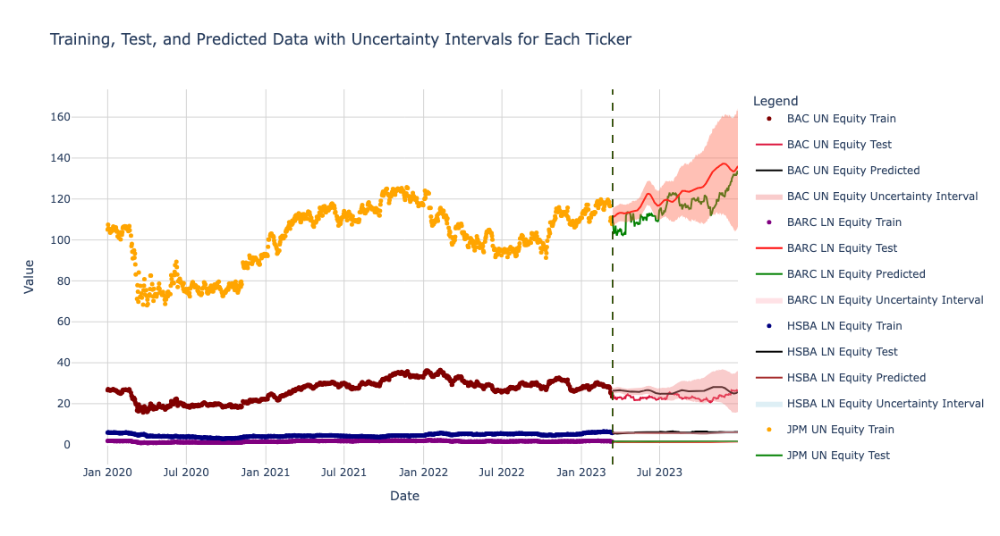

In [18]:
import plotly.graph_objects as go
import pandas as pd

# Initialize the figure
fig = go.Figure()

# Define distinct colors and settings for each type of data for each ticker
colors = {
    'HSBA LN Equity': {'train': 'navy', 'test': 'black', 'predicted': 'brown', 'interval': 'rgba(173, 216, 230, 0.4)'},
    'BARC LN Equity': {'train': 'purple', 'test': 'red', 'predicted': 'green', 'interval': 'rgba(255, 182, 193, 0.4)'},
    'JPM UN Equity': {'train': 'orange', 'test': 'green', 'predicted': 'red', 'interval': 'rgba(255, 99, 71, 0.4)'},
    'BAC UN Equity': {'train': 'maroon', 'test': 'crimson', 'predicted': 'black', 'interval': 'rgba(240, 128, 128, 0.4)'}
}

# Assuming you have observed_data iterable with group_train, group_test per ticker
for ticker, group_train, group_test in observed_data:
    # Merge forecast data with actual data based on date ('ds') and ticker
    forecast = all_forecasts[all_forecasts['ticker'] == ticker]
    actual_vs_predicted = pd.merge(group_test, forecast, on='ds', how='inner')

    # Add trace for training data as bubbles
    fig.add_trace(go.Scatter(x=group_train['ds'], y=group_train['y'],
                             mode='markers', name=f'{ticker} Train',
                             marker=dict(size=5, color=colors[ticker]['train'])))

    # Add trace for test data
    fig.add_trace(go.Scatter(x=group_test['ds'], y=group_test['y'],
                             mode='lines', name=f'{ticker} Test',
                             line=dict(color=colors[ticker]['test'])))

    # Add trace for predicted values
    fig.add_trace(go.Scatter(x=actual_vs_predicted['ds'], y=actual_vs_predicted['yhat'],
                             mode='lines', name=f'{ticker} Predicted',
                             line=dict(color=colors[ticker]['predicted'])))

    # Add uncertainty intervals with legend entry
    interval_name = f'{ticker} Uncertainty Interval'
    fig.add_trace(go.Scatter(x=actual_vs_predicted['ds'], y=actual_vs_predicted['yhat_upper'],
                             mode='lines', name=interval_name,
                             line=dict(width=0),
                             showlegend=False))

    fig.add_trace(go.Scatter(x=actual_vs_predicted['ds'], y=actual_vs_predicted['yhat_lower'],
                             mode='lines', line=dict(width=0),
                             fill='tonexty',  # Fill area between
                             fillcolor=colors[ticker]['interval'],
                             showlegend=True, legendgroup=interval_name, name=interval_name))

    # Add a vertical line to indicate the start of test data for each ticker
    fig.add_vline(x=group_test['ds'].iloc[0], line_width=1, line_dash="dash", line_color=colors[ticker]['test'])

# Update layout to enhance aesthetics and functionality
fig.update_layout(
    title='Training, Test, and Predicted Data with Uncertainty Intervals for Each Ticker',
    xaxis_title='Date',
    yaxis_title='Value',
    legend_title="Legend",
    plot_bgcolor='white',
    xaxis=dict(showgrid=True, gridcolor='lightgrey'),
    yaxis=dict(showgrid=True, gridcolor='lightgrey'),
    height=600,  # Adjust height based on your preference
    width=1200,  # Adjust width based on your preference
)

# Show the plot
fig.show()


#### <u>SEPARATING THE PREDICTIONS WITH THE ACTUALS AND UNCERTAINTY LEVEL FOR EACH TICKER</u>

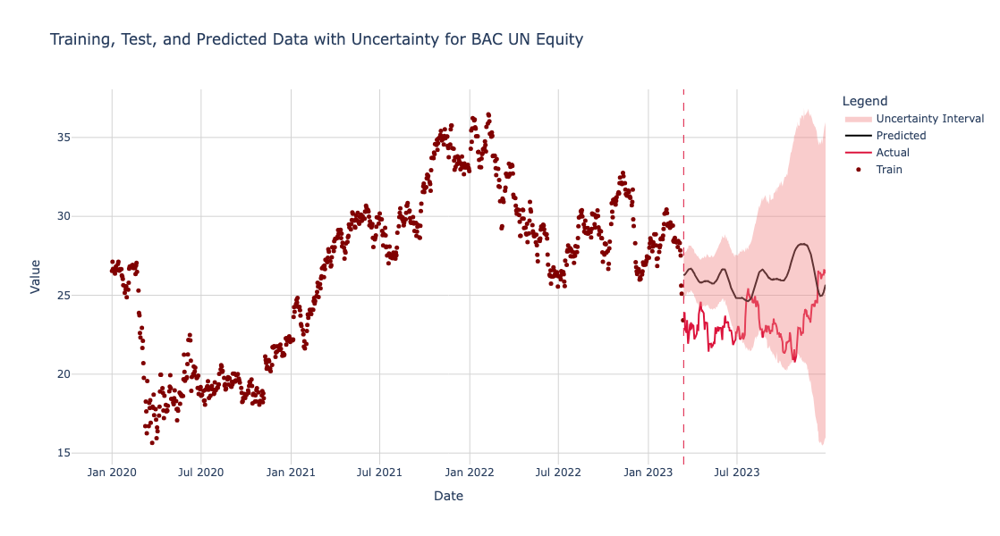

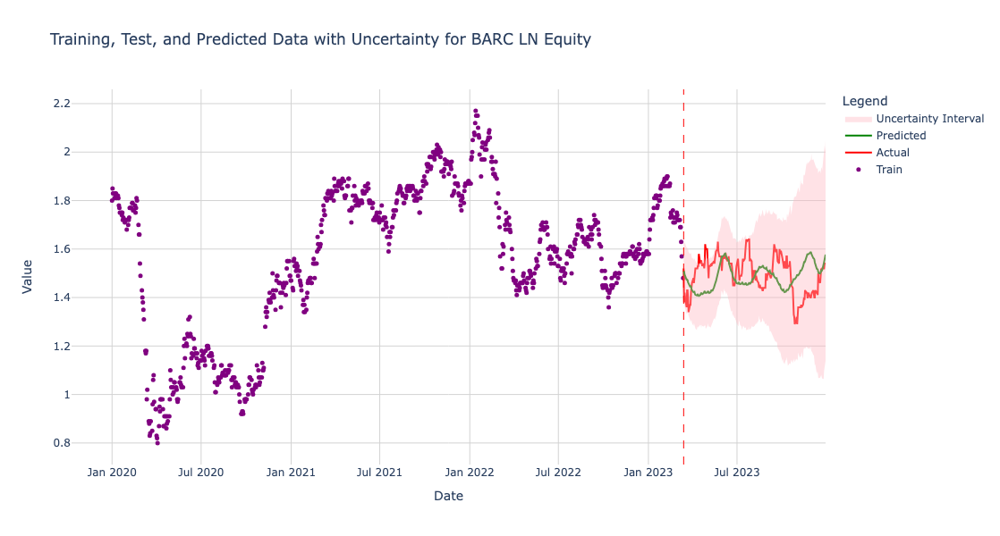

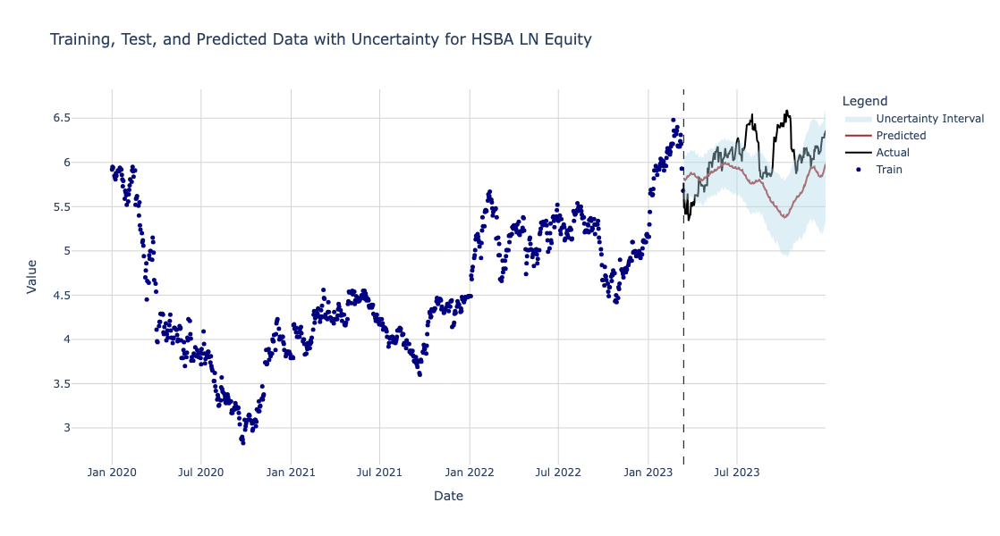

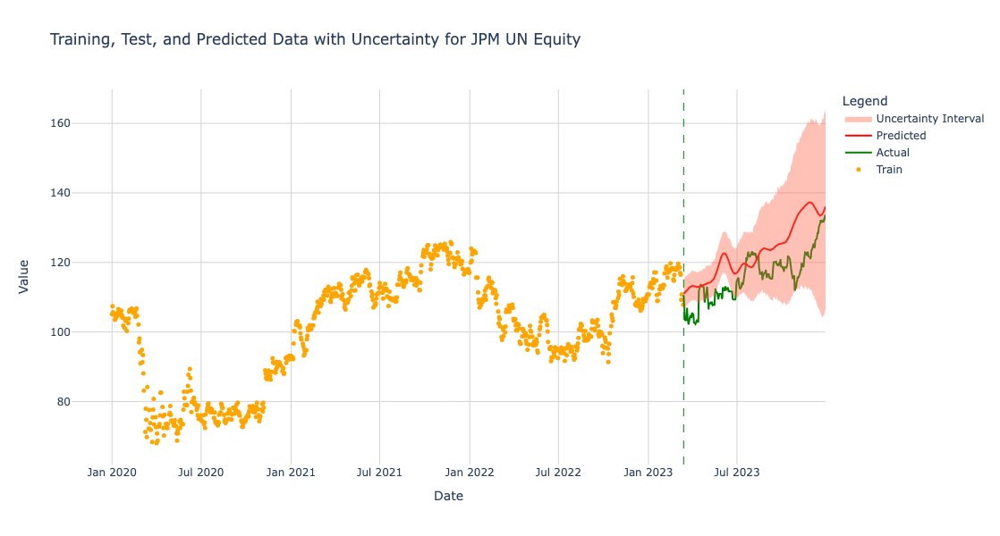

In [19]:
import plotly.graph_objects as go
import pandas as pd

# Define distinct colors and settings for each type of data for each ticker
colors = {
    'HSBA LN Equity': {'train': 'navy', 'test': 'black', 'predicted': 'brown', 'interval': 'rgba(173, 216, 230, 0.4)'},
    'BARC LN Equity': {'train': 'purple', 'test': 'red', 'predicted': 'green', 'interval': 'rgba(255, 182, 193, 0.4)'},
    'JPM UN Equity': {'train': 'orange', 'test': 'green', 'predicted': 'red', 'interval': 'rgba(255, 99, 71, 0.4)'},
    'BAC UN Equity': {'train': 'maroon', 'test': 'crimson', 'predicted': 'black', 'interval': 'rgba(240, 128, 128, 0.4)'}
}

# Assuming you have observed_data iterable with group_train, group_test per ticker
for ticker, group_train, group_test in observed_data:
    # Initialize the figure for each ticker
    fig = go.Figure()

    # Merge forecast data with actual data based on date ('ds') and ticker
    forecast = all_forecasts[all_forecasts['ticker'] == ticker]
    actual_vs_predicted = pd.merge(group_test, forecast, on='ds', how='inner')

    # Add trace for training data as bubbles
    fig.add_trace(go.Scatter(x=group_train['ds'], y=group_train['y'],
                             mode='markers', name='Train',
                             marker=dict(size=5, color=colors[ticker]['train'])))

    # Add trace for test data
    fig.add_trace(go.Scatter(x=group_test['ds'], y=group_test['y'],
                             mode='lines', name='Actual',
                             line=dict(color=colors[ticker]['test'])))

    # Add trace for predicted values
    fig.add_trace(go.Scatter(x=actual_vs_predicted['ds'], y=actual_vs_predicted['yhat'],
                             mode='lines', name='Predicted',
                             line=dict(color=colors[ticker]['predicted'])))

    # Add uncertainty intervals with legend entry
    fig.add_trace(go.Scatter(x=actual_vs_predicted['ds'], y=actual_vs_predicted['yhat_upper'],
                             mode='lines', line=dict(width=0),
                             showlegend=False))

    fig.add_trace(go.Scatter(x=actual_vs_predicted['ds'], y=actual_vs_predicted['yhat_lower'],
                             mode='lines', line=dict(width=0),
                             fill='tonexty',  # Fill area between
                             fillcolor=colors[ticker]['interval'],
                             showlegend=True, name='Uncertainty Interval'))

    # Add a vertical line to indicate the start of test data for each ticker
    fig.add_vline(x=group_test['ds'].iloc[0], line_width=1, line_dash="dash", line_color=colors[ticker]['test'])

    # Update layout to enhance aesthetics and functionality
    fig.update_layout(
        title=f'Training, Test, and Predicted Data with Uncertainty for {ticker}',
        xaxis_title='Date',
        yaxis_title='Value',
        legend_title="Legend",
        plot_bgcolor='white',
        xaxis=dict(showgrid=True, gridcolor='lightgrey'),
        yaxis=dict(showgrid=True, gridcolor='lightgrey'),
        height=600,  # Adjust height based on your preference
        width=1200,  # Adjust width based on your preference
    )

    # Show the plot
    fig.show()


#### <u>PLOTTING THE PROPHET COMPONENT FOR TREND, SEASONALITY AND HOLIDAY USING THE FORECAST</u>

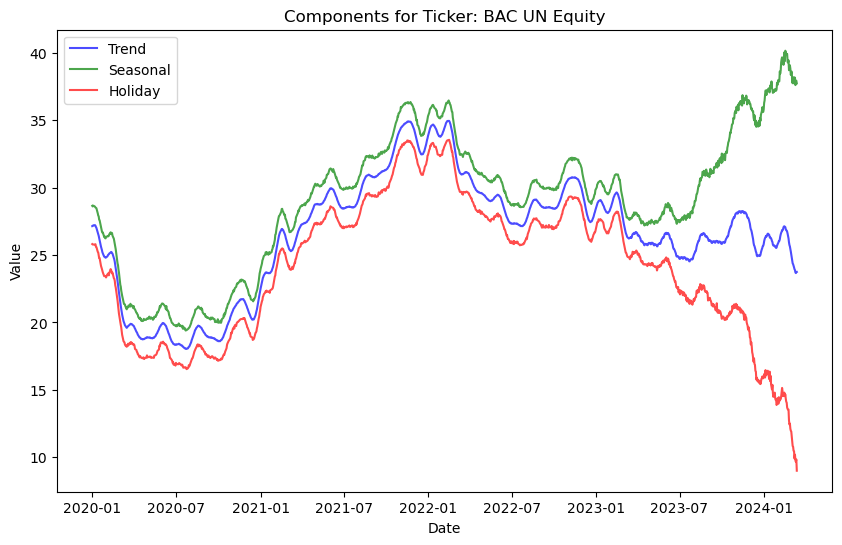

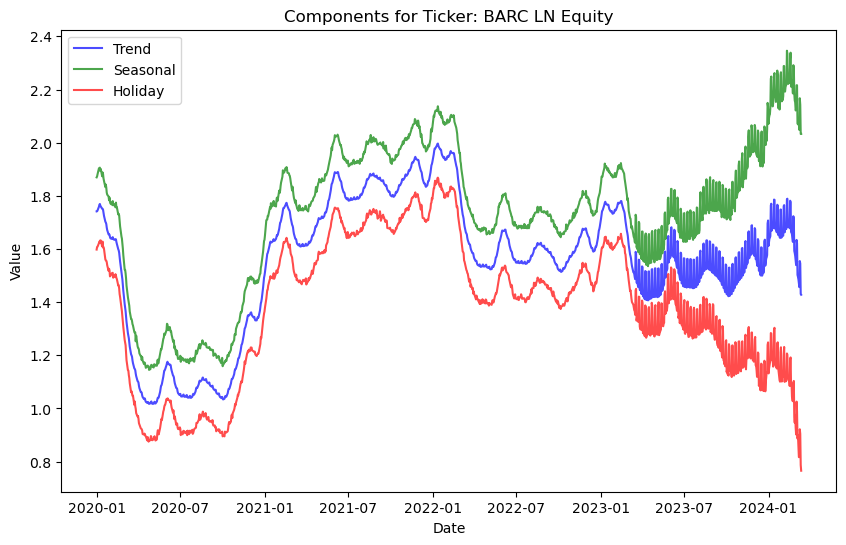

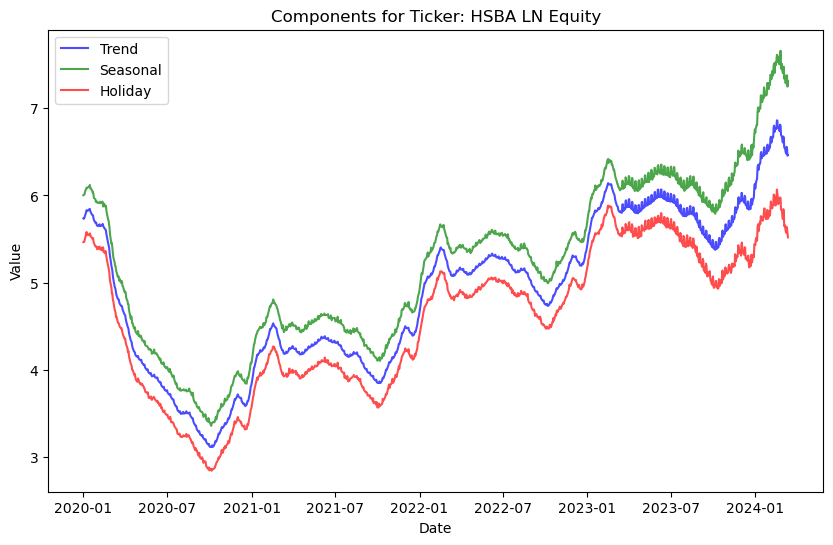

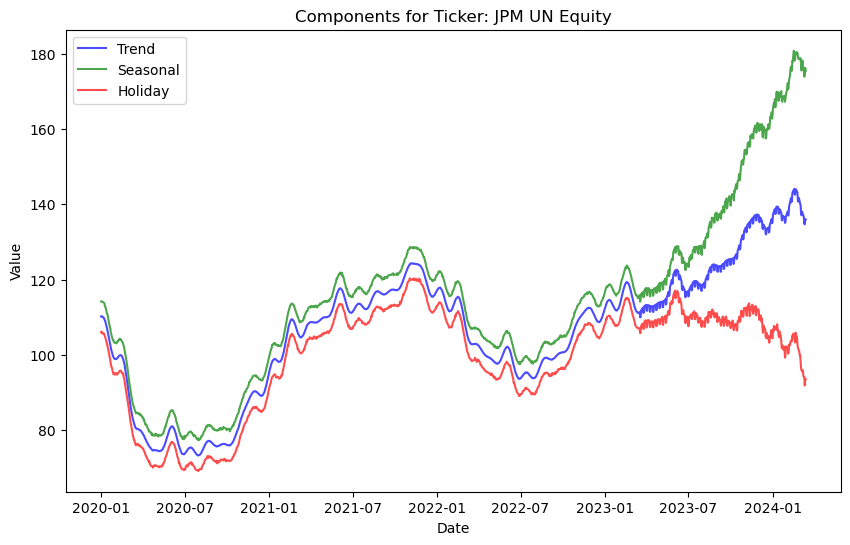

In [20]:
# Get unique ticker symbols
tickers = all_forecasts['ticker'].unique()

# Plot the components for each ticker
for ticker in tickers:
    # Filter the forecasted data for the current ticker
    forecast_ticker = all_forecasts[all_forecasts['ticker'] == ticker]
    
    # Initialize the plot
    plt.figure(figsize=(10, 6))
    
    # Plot the trend component
    plt.plot(forecast_ticker['ds'], forecast_ticker['yhat'], label='Trend', color='blue', alpha=0.7)
    
    # Plot the seasonal component
    plt.plot(forecast_ticker['ds'], forecast_ticker['yhat_upper'], label='Seasonal', color='green', alpha=0.7)
    
    # Plot the holiday component
    plt.plot(forecast_ticker['ds'], forecast_ticker['yhat_lower'], label='Holiday', color='red', alpha=0.7)
    
    # Set plot title and labels
    plt.title(f'Components for Ticker: {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Value')
    
    # Add legend
    plt.legend()
    
    # Show plot
    plt.show()
